# Installation's






In [1]:
!pip install pandas-profiling==2.7.1

     |████████████████████████████████| 256kB 2.1MB/s 
     |████████████████████████████████| 3.1MB 16.3MB/s 
     |████████████████████████████████| 1.1MB 32.2MB/s 
     |████████████████████████████████| 61kB 6.6MB/s 
     |████████████████████████████████| 81kB 8.9MB/s 
     |████████████████████████████████| 296kB 31.7MB/s 
  Created wheel for phik: filename=phik-0.11.2-cp37-none-any.whl size=1107413 sha256=0b41b323b15438481488588e848e10544f942c930864709988e746dd44515af9
  Stored in directory: /root/.cache/pip/wheels/c0/a3/b0/f27b1cfe32ea131a3715169132ff6d85653789e80e966c3bf6
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp37-none-any.whl size=27085 sha256=df0724e5bd453f501758fe67cac75b2c7ff797fb6ced9f13ecc66622b6430f9c
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
Successfully built phik htmlmin
ERROR: phik 0.11.2 has requirement scipy>=1.5.2, but you'll have scipy 1.4.1 which is incompatible.
  Found existing in

In [2]:
import sys
!conda install --yes --prefix {sys.prefix} pandas tensorflow scikit-learn matplotlib

/bin/bash: conda: command not found



 # Basic Explorations 

In [109]:
import pandas as pd

# fit the model to historical data
!wget  https://covid.ourworldindata.org/data/owid-covid-data.csv -O covid.csv
covid = pd.read_csv("covid.csv") 
!wget  https://www.gstatic.com/covid19/mobility/Global_Mobility_Report.csv -O mobility.csv
mobility = pd.read_csv("mobility.csv") 
df = covid[(covid.location == 'Jordan')]
df2= mobility[(mobility.country_region)=='Jordan']
df['date'] = pd.to_datetime(df['date'])
df2['date'] = pd.to_datetime(df2['date'])

--2021-05-25 07:29:43--  https://covid.ourworldindata.org/data/owid-covid-data.csv
Resolving covid.ourworldindata.org (covid.ourworldindata.org)... 104.21.233.138, 104.21.233.137, 2606:4700:3038::6815:e98a, ...
Connecting to covid.ourworldindata.org (covid.ourworldindata.org)|104.21.233.138|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘covid.csv’

covid.csv               [   <=>              ]  22.58M  38.6MB/s    in 0.6s    

2021-05-25 07:29:44 (38.6 MB/s) - ‘covid.csv’ saved [23676464]

--2021-05-25 07:29:44--  https://www.gstatic.com/covid19/mobility/Global_Mobility_Report.csv
Resolving www.gstatic.com (www.gstatic.com)... 108.177.125.94, 2404:6800:4008:c00::5e
Connecting to www.gstatic.com (www.gstatic.com)|108.177.125.94|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 536711433 (512M) [text/csv]
Saving to: ‘mobility.csv’

mobility.csv        100%[===================>] 511.85M   109MB/s    in 

In [4]:
dfexp = df2[['retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline']]

No handles with labels found to put in legend.


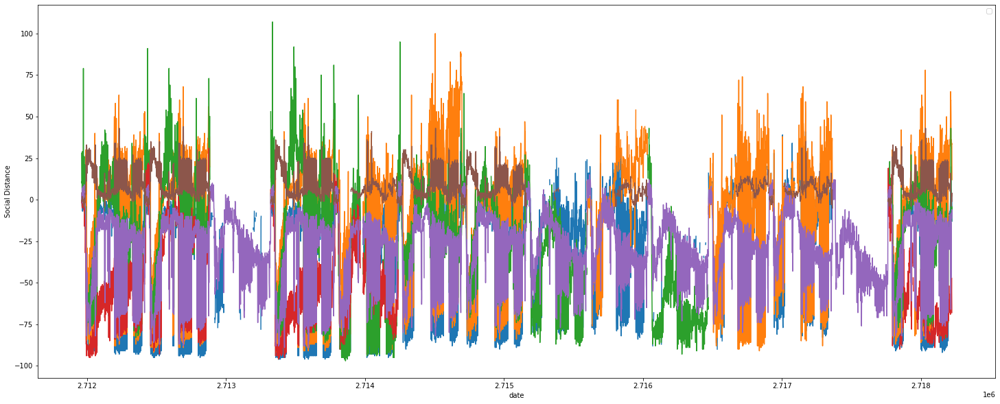

In [5]:
import warnings
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(dfexp)

ax.set_ylabel('Social Distance')
ax.set_xlabel('date')

ax.legend();

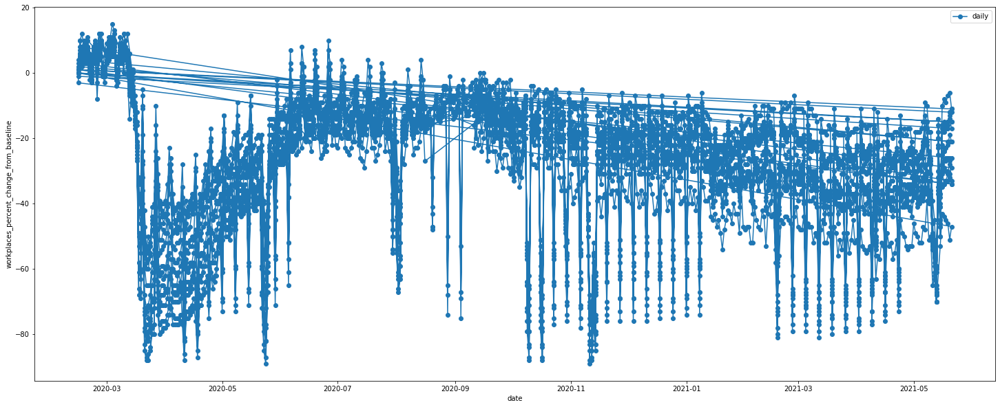

In [6]:
import warnings
import matplotlib.pyplot as plt
x = df2['date']
y = df2['workplaces_percent_change_from_baseline']

fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(x,y,marker='o', linestyle='-', label='daily')

ax.set_ylabel('workplaces_percent_change_from_baseline')
ax.set_xlabel('date')

ax.legend();

In [7]:
df2.head()

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
2711960,JO,Jordan,NaN,NaN,NaN,NaN,NaN,ChIJmd5kZkdvABURmU4mUQdbKI0,2020-02-15,4.0,4.0,28.0,2.0,0.0,-1.0
2711961,JO,Jordan,NaN,NaN,NaN,NaN,NaN,ChIJmd5kZkdvABURmU4mUQdbKI0,2020-02-16,-1.0,2.0,10.0,-1.0,4.0,-1.0
2711962,JO,Jordan,NaN,NaN,NaN,NaN,NaN,ChIJmd5kZkdvABURmU4mUQdbKI0,2020-02-17,-3.0,0.0,11.0,-2.0,4.0,0.0
2711963,JO,Jordan,NaN,NaN,NaN,NaN,NaN,ChIJmd5kZkdvABURmU4mUQdbKI0,2020-02-18,-4.0,0.0,9.0,0.0,4.0,0.0
2711964,JO,Jordan,NaN,NaN,NaN,NaN,NaN,ChIJmd5kZkdvABURmU4mUQdbKI0,2020-02-19,-5.0,-2.0,4.0,-4.0,4.0,0.0


In [8]:
mask = (df2['date'] == '2020-05-24')
df3 =df2.loc[mask]
df3

,country_region_code,country_region,sub_region_1,sub_region_2,metro_area,iso_3166_2_code,census_fips_code,place_id,date,retail_and_recreation_percent_change_from_baseline,grocery_and_pharmacy_percent_change_from_baseline,parks_percent_change_from_baseline,transit_stations_percent_change_from_baseline,workplaces_percent_change_from_baseline,residential_percent_change_from_baseline
2712059,JO,Jordan,NaN,NaN,NaN,NaN,NaN,ChIJmd5kZkdvABURmU4mUQdbKI0,2020-05-24,-91.0,-83.0,-74.0,-94.0,-82.0,33.0
2712521,JO,Jordan,NaN,NaN,Amman Metropolitan Area,NaN,NaN,ChIJ_4wfcu-dHBURdOPJhveqFqM,2020-05-24,-93.0,-87.0,-77.0,-93.0,-87.0,35.0
2712983,JO,Jordan,Ajloun Governorate,NaN,NaN,JO-AJ,NaN,ChIJ0x2FS0yGHBURCQuAJO-KM5s,2020-05-24,-63.0,NaN,NaN,NaN,-56.0,NaN
2713420,JO,Jordan,Amman Governorate,NaN,NaN,JO-AM,NaN,ChIJn8YjZ44mGxURrihelNUoc_4,2020-05-24,-95.0,-90.0,-82.0,-95.0,-89.0,36.0
2713882,JO,Jordan,Aqaba Governorate,NaN,NaN,JO-AQ,NaN,ChIJf90wZmIBARUR0ks0OfjYXbY,2020-05-24,-92.0,-82.0,-91.0,NaN,-78.0,NaN
2714337,JO,Jordan,Balqa Governorate,NaN,NaN,JO-BA,NaN,ChIJddKbF6C8HBURJpq3BevAarE,2020-05-24,-82.0,-68.0,-32.0,NaN,-77.0,32.0
2714797,JO,Jordan,Irbid Governorate,NaN,NaN,JO-IR,NaN,ChIJR-K7owN6HBURAdOn34zGag4,2020-05-24,-85.0,-74.0,-63.0,NaN,-68.0,29.0
2715259,JO,Jordan,Jerash Governorate,NaN,NaN,JO-JA,NaN,ChIJSUQoXQiBHBURohPlil7pdZQ,2020-05-24,-75.0,-58.0,-82.0,NaN,-63.0,NaN
2715696,JO,Jordan,Karak Governorate,NaN,NaN,JO-KA,NaN,ChIJ-fSpk2l5AxURS6csH2mO0Vs,2020-05-24,-64.0,-63.0,NaN,NaN,-55.0,NaN
2716133,JO,Jordan,Ma'an Governorate,NaN,NaN,JO-MN,NaN,ChIJrTEf733UBRURZmUwDW3MHTY,2020-05-24,-82.0,NaN,-78.0,NaN,-49.0,NaN


In [9]:
df3 = df2[["country_region","date",
           "retail_and_recreation_percent_change_from_baseline",
           "grocery_and_pharmacy_percent_change_from_baseline",
           "parks_percent_change_from_baseline",
           "transit_stations_percent_change_from_baseline",
           "workplaces_percent_change_from_baseline"	,
           "residential_percent_change_from_baseline"]]

In [10]:
df3 = df3.groupby(['date']).mean()

In [11]:
df3 = df3.mean(axis=1)

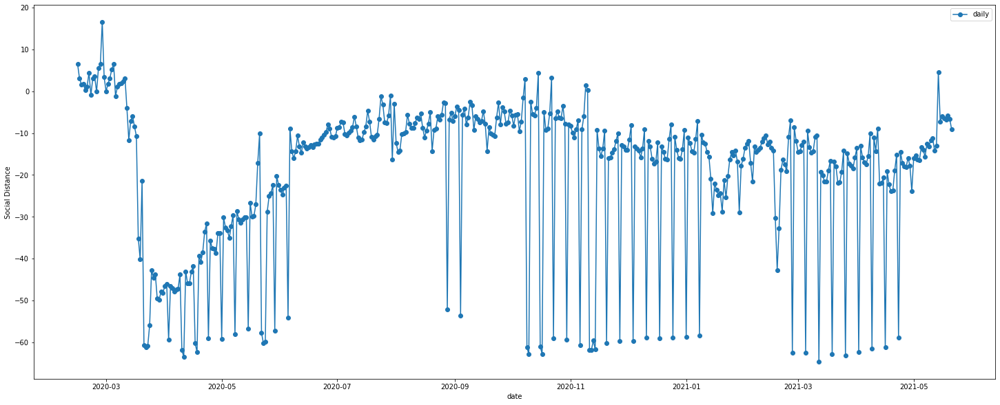

In [12]:
import warnings
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(df3,marker='o', linestyle='-', label='daily')

ax.set_ylabel('Social Distance')
ax.set_xlabel('date')

ax.legend();

In [13]:
dfmerge = df.merge(df2.groupby(['date']).mean(), on = 'date')

In [14]:
dfmerge = dfmerge[['date', 'new_cases',
       'new_tests',
       'positive_rate',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline']]

In [15]:
dff = dfmerge[[ 'new_cases',
       'new_tests',
       'positive_rate',
       'retail_and_recreation_percent_change_from_baseline',
       'grocery_and_pharmacy_percent_change_from_baseline',
       'parks_percent_change_from_baseline',
       'transit_stations_percent_change_from_baseline',
       'workplaces_percent_change_from_baseline',
       'residential_percent_change_from_baseline']]

No handles with labels found to put in legend.


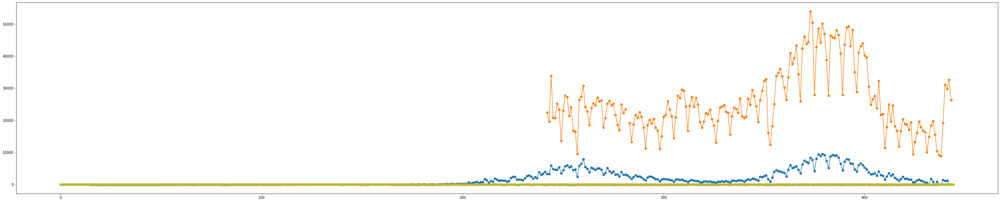

In [16]:
import warnings
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(50, 10))
ax.plot(dff,marker='o', linestyle='-')


ax.legend();

In [17]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
df = pd.DataFrame(dff)
profile = ProfileReport(df, title="Pandas Profiling Report")
profile.to_file('testdf2.html')

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
from IPython.display import HTML, display
from google.colab import output

# Render the HTML.
display(HTML(open('testdf2.html').read()))

html_text = output.eval_js('document.body.innerText')

Number of variables,9
Number of observations,445
Missing cells,494
Missing cells (%),12.3%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,34.8 KiB
Average record size in memory,80.0 B
NUM,9
Analysis started,2021-05-25 06:54:28.343712
Analysis finished,2021-05-25 06:54:45.098974


In [87]:
df3 = df2[["country_region","date",
           "retail_and_recreation_percent_change_from_baseline",
           "grocery_and_pharmacy_percent_change_from_baseline",
           "parks_percent_change_from_baseline",
           "transit_stations_percent_change_from_baseline",
           "workplaces_percent_change_from_baseline"	,
           "residential_percent_change_from_baseline"]]

In [96]:
df3 = df3.groupby(['date']).mean().rolling(14).mean().mean(axis=1)

In [97]:
df3

date
2020-02-15          NaN
2020-02-16          NaN
2020-02-17          NaN
2020-02-18          NaN
2020-02-19          NaN
                ...    
2021-05-17   -10.757374
2021-05-18   -10.072680
2021-05-19    -9.523493
2021-05-20    -8.988646
2021-05-21    -8.522287
Length: 462, dtype: float64

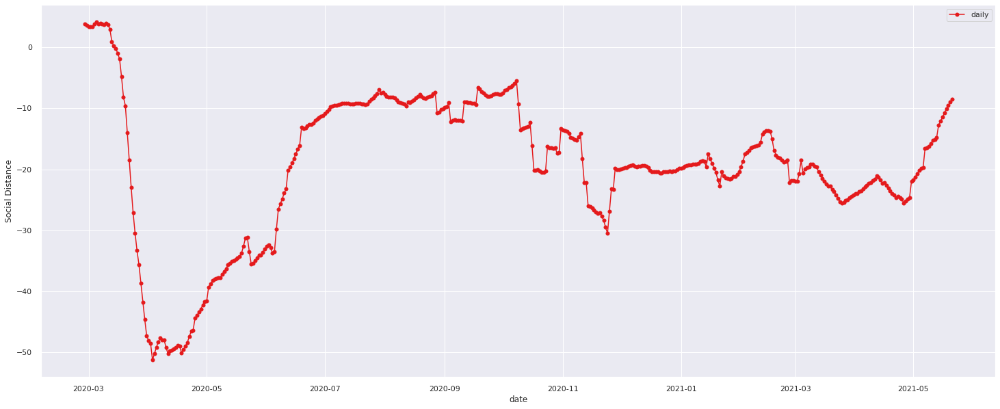

In [98]:
import warnings
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(25, 10))
ax.plot(df3,marker='o', linestyle='-', label='daily')

ax.set_ylabel('Social Distance')
ax.set_xlabel('date')

ax.legend();

In [24]:
#dfmerge = df.merge(df3.groupby(['date']).mean(), on = 'date')

In [110]:
df = df[['date','new_cases', 'new_tests','positive_rate']]

In [106]:
df3 = df3.to_frame()

In [ ]:
df3

In [119]:
dfmerge = df.merge(df3, on = 'date')

In [120]:
dfmerge.columns

Index(['date', 'new_cases', 'new_tests', 'positive_rate', 0], dtype='object')

In [115]:
#dfmerge = df.rename(columns={0: 'SocialDistance'})

In [121]:
dff = dfmerge[['new_cases', 'new_tests', 'positive_rate',0]]

No handles with labels found to put in legend.


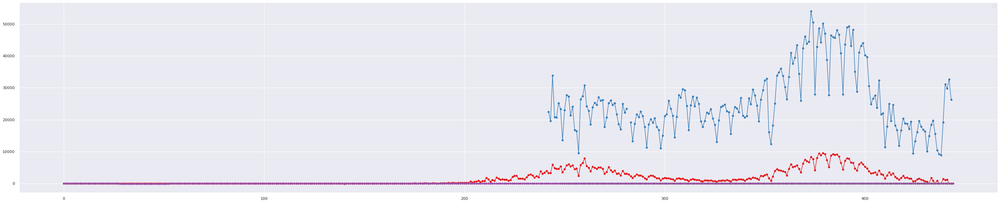

In [122]:
import warnings
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(50, 10))
ax.plot(dff,marker='o', linestyle='-')


ax.legend();

In [123]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
df = pd.DataFrame(dff)
profile = ProfileReport(df, title="Pandas Profiling Report")
profile.to_file('testdf.html')

Summarize dataset:   0%|          | 0/16 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [124]:
from IPython.display import HTML, display
from google.colab import output

# Render the HTML.
display(HTML(open('testdf.html').read()))

html_text = output.eval_js('document.body.innerText')

Number of variables,4
Number of observations,445
Missing cells,494
Missing cells (%),27.8%
Duplicate rows,0
Duplicate rows (%),0.0%
Total size in memory,37.4 KiB
Average record size in memory,86.0 B
NUM,4
Analysis started,2021-05-25 07:35:26.389767
Analysis finished,2021-05-25 07:35:32.465930


#Time Series Models

ARIMA

In [48]:

df = pd.read_csv('covid.csv',header=0)
df = df[(df.location == 'Jordan')]


In [49]:
import pandas as pd
import numpy as np
import itertools
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, acf, pacf,arma_order_select_ic
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
import warnings
warnings.simplefilter('ignore')
sns.set(palette = 'Set1',style='darkgrid')
#Function for making a time serie on a designated country and plotting the rolled mean and standard 
def roll(case='new_cases'):
    ts=df.loc[(df['location']=='Jordan')]  
    ts=ts[['date',case]]
    ts=ts.set_index('date')
    ts.astype('int64')
    a=len(ts.loc[(ts['new_cases']>=10)])
    ts=ts[-a:]
    return (ts.rolling(window=4,center=False).mean().dropna())


def rollPlot(case='new_cases'):
    ts=df.loc[(df['location']=='Jordan')]  
    ts=ts[['date',case]]
    ts=ts.set_index('date')
    ts.astype('int64')
    a=len(ts.loc[(ts['new_cases']>=10)])
    ts=ts[-a:]
    plt.figure(figsize=(16,6))
    plt.plot(ts.rolling(window=7,center=False).mean().dropna(),label='Rolling Mean')
    plt.plot(ts[case])
    plt.plot(ts.rolling(window=7,center=False).std(),label='Rolling std')
    plt.legend()
    plt.title('Cases distribution in %s with rolling mean and standard' )
    plt.xticks([])


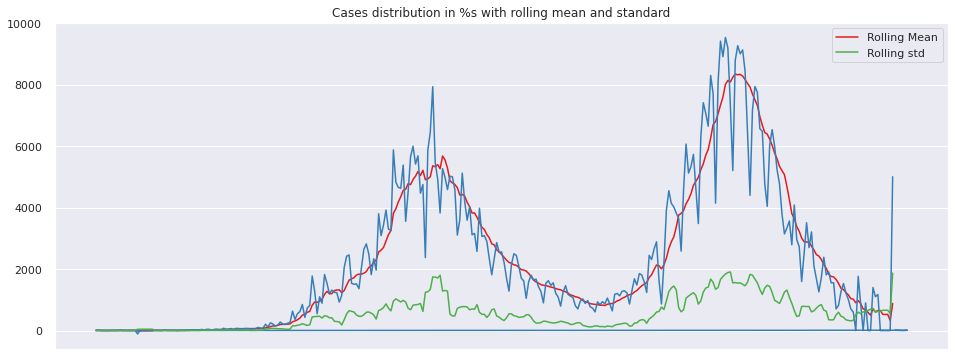

In [50]:
tsC1=roll()
rollPlot()

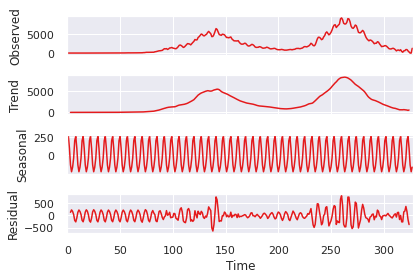

In [51]:
fig=sm.tsa.seasonal_decompose(tsC1.values,freq=7).plot()

In [52]:
def stationarity(ts):
    print('Results of Dickey-Fuller Test:')
    test = adfuller(ts, autolag='AIC')
    results = pd.Series(test[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for i,val in test[4].items():
        results['Critical Value (%s)'%i] = val
    print (results)

tsC=tsC1['new_cases'].values
stationarity(tsC)

Results of Dickey-Fuller Test:
Test Statistic                  -2.935229
p-value                          0.041402
#Lags Used                      16.000000
Number of Observations Used    311.000000
Critical Value (1%)             -3.451553
Critical Value (5%)             -2.870879
Critical Value (10%)            -2.571746
dtype: float64


                             ARIMA Model Results                              
Dep. Variable:                   D2.y   No. Observations:                  322
Model:                 ARIMA(5, 2, 5)   Log Likelihood               -2073.167
Method:                       css-mle   S.D. of innovations            147.571
Date:                Tue, 25 May 2021   AIC                           4170.333
Time:                        07:04:10   BIC                           4215.628
Sample:                             2   HQIC                          4188.416
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0546      2.005     -0.027      0.978      -3.985       3.876
ar.L1.D2.y    -0.0907      0.057     -1.603      0.110      -0.202       0.020
ar.L2.D2.y    -0.4798      0.046    -10.501      0.0

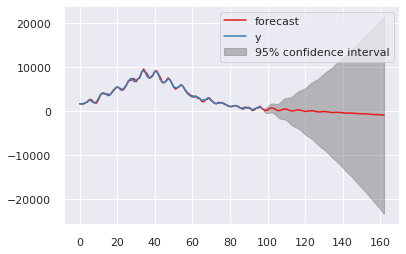

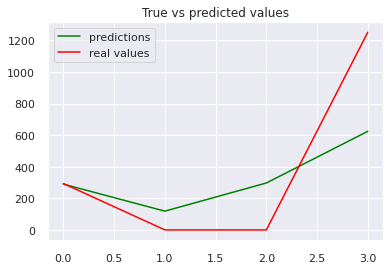

In [53]:
train = df.set_index(['date'])
test = df.set_index(['date'])

train_features=pd.DataFrame(train)
test_features=pd.DataFrame(test)
features_and_target_train = pd.concat([train,train_features], axis=1)
features_and_target_test = pd.concat([test,test_features], axis=1)
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

features_and_target_train= features_and_target_train
x_train= features_and_target_train[['new_cases']]
y1 = features_and_target_train[['new_cases']]
x_test = features_and_target_test[['new_cases']]
#Mean absolute percentage error
def mape(y1, y_pred): 
    y1, y_pred = np.array(y1), np.array(y_pred)
    return np.mean(np.abs((y1 - y_pred) / y1)) * 100

def split(ts):
    size = int(len(ts) * 0.99)
    train= ts[:size]
    test = ts[size:]
    return(train,test)


#Arima modeling for ts
def arima(ts,test):
    p=d=q=range(0,6)
    a=99999
    pdq=list(itertools.product(p,d,q))
    
    #Determining the best parameters
    for var in pdq:
        try:
            model = ARIMA(ts, order=var)
            result = model.fit()

            if (result.aic<=a) :
                a=result.aic
                param=var
        except:
            continue
            
    #Modeling
    model = ARIMA(ts, order=param)
    result = model.fit()
    result.plot_predict(start=int(len(ts) * 0.7), end=int(len(ts) * 1.2))
    pred=result.forecast(steps=len(test))[0]
    #Plotting results
    f,ax=plt.subplots()
    plt.plot(pred,c='green', label= 'predictions')
    plt.plot(test, c='red',label='real values')
    plt.legend()
    plt.title('True vs predicted values')
    #Printing the error metrics
    print(result.summary())        
    
    print('\nMean absolute percentage error: %f'%mape(test,pred))
    return (pred)



train,test=split(tsC)
pred=arima(train,test)

#LSTM

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

np.random.seed(1)

#Load the sequence data from CSV
cases = pd.read_csv('covid.csv',header=0)
cases = cases[(cases.location == 'Jordan')]
cases = cases[['new_cases']]

#Review loaded data
print(cases.dtypes)
cases.head()


new_cases    float64
dtype: object


,new_cases
42460,1.0
42461,0.0
42462,0.0
42463,0.0
42464,0.0


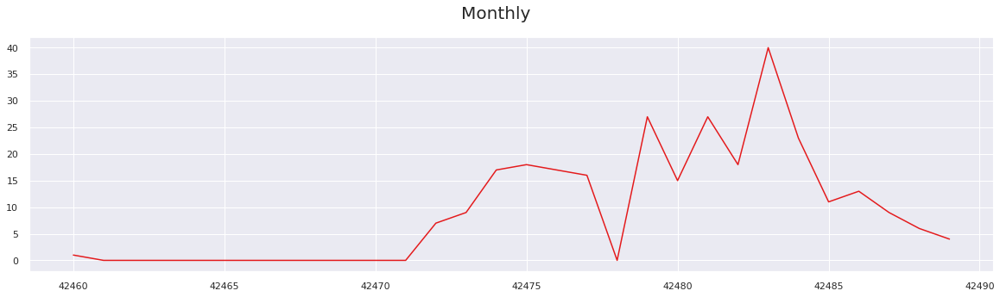

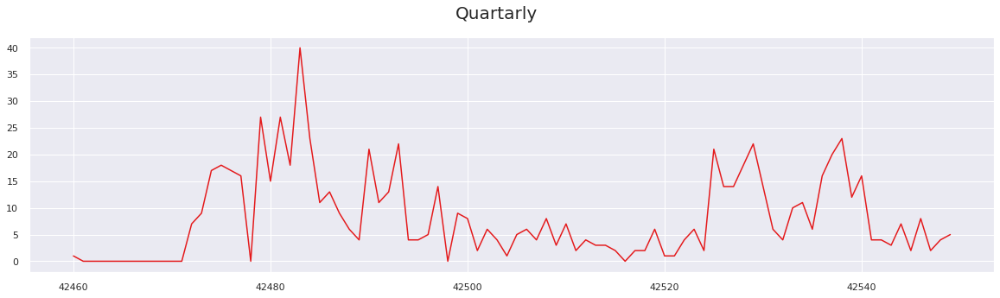

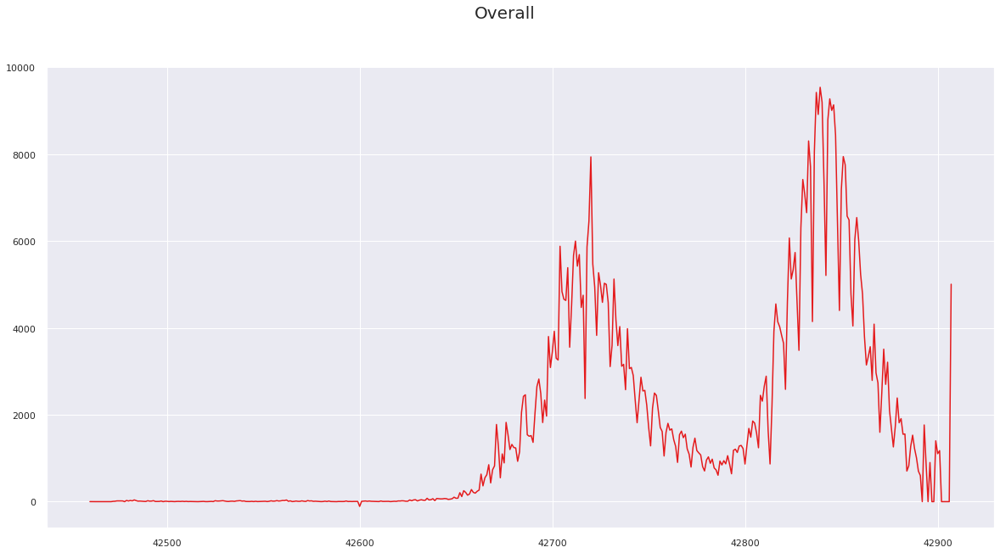

In [59]:
#Plat the data loaded to visualize trends

#Monthly
plt.figure(figsize=(20,5)).suptitle("Monthly", fontsize=20)
plt.plot(cases.head(30))
plt.show()

#Quartarly
plt.figure(figsize=(20,5)).suptitle("Quartarly", fontsize=20)
plt.plot(cases.head(90))
plt.show()
#all
plt.figure(figsize=(20,10)).suptitle("Overall", fontsize=20)
plt.plot(cases)
plt.show()

In [60]:
from sklearn.preprocessing import StandardScaler

#Scale the data
print("Request Range before scaling : " , 
          min(cases.new_cases),
          max(cases.new_cases))

scaler = StandardScaler()
scaled_cases=scaler.fit_transform(cases)
print("Request Range after scaling : " , 
          min(scaled_cases),
          max(scaled_cases))

#Training data has to be sequencial - first 13 month
train_size = 1 * 30 * 13

#Number of samples to lookback for each sample
lookback=2 * 30

#Separate training and test data
train_cases = scaled_cases[0:train_size,:]

#Add an additional week for lookback.
test_cases = scaled_cases[train_size-lookback:,:]

print("\n Shaped of Train, Test : ",
      train_cases.shape, test_cases.shape)

Request Range before scaling :  -110.0 9535.0
Request Range after scaling :  [-0.77965257] [3.53542176]

 Shaped of Train, Test :  (390, 1) (118, 1)


Build a LSTM model with Keras

In [61]:
#Prepare RNN Dataset. 
#Each data point (X) is linked to the previous data points of size=lookback
#The predicted value (Y) is the next point

def create_rnn_dataset(data, lookback=1):
    
    data_x, data_y = [], []
    for i in range(len(data)- lookback -1):
            #All points from this point, looking backwards upto lookback
            a = data[i:(i+ lookback), 0]
            data_x.append(a)
            #The next point
            data_y.append(data[i + lookback, 0])
    return np.array(data_x), np.array(data_y)

#Create X and Y for training
train_req_x, train_req_y = create_rnn_dataset(train_cases,lookback)

#Reshape for use with LSTM
train_req_x = np.reshape(train_req_x, 
                         (train_req_x.shape[0],1, train_req_x.shape[1]))

print("Shapes of X, Y: ",train_req_x.shape, train_req_y.shape)

Shapes of X, Y:  (329, 1, 60) (329,)


In [62]:
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import LSTM,Dense 
import tensorflow as tf

tf.random.set_seed(3)

#Create a Keras Model
ts_model=Sequential()

#Add LSTM
ts_model.add(LSTM(256, input_shape=(1,lookback)))
ts_model.add(Dense(1))

#Compile with Adam Optimizer. Optimize for minimum mean square error
ts_model.compile(loss="mean_squared_error", optimizer="adam", metrics=["mse"])

#Print model summary
ts_model.summary()

#Train the model
ts_model.fit(train_req_x, train_req_y, epochs=5, batch_size=1, verbose=1)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_2 (LSTM)                (None, 256)               324608    
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 324,865
Trainable params: 324,865
Non-trainable params: 0
_________________________________________________________________
Epoch 1/5
329/329 [==============================] - 3s 3ms/step - loss: 0.2069 - mse: 0.2069
Epoch 2/5
329/329 [==============================] - 1s 3ms/step - loss: 0.0799 - mse: 0.0799
Epoch 3/5
329/329 [==============================] - 1s 3ms/step - loss: 0.0544 - mse: 0.0544
Epoch 4/5
329/329 [==============================] - 1s 3ms/step - loss: 0.0500 - mse: 0.0500
Epoch 5/5
329/329 [==============================] - 1s 3ms/step - loss: 0.0543 - mse: 0.0543


Test 

In [63]:
#Preprocess the test dataset, the same way training set is processed
test_req_x, test_req_y = create_rnn_dataset(test_cases,lookback)
test_req_x = np.reshape(test_req_x, 
                         (test_req_x.shape[0],1, 
                          test_req_x.shape[1]))

#Evaluate the model
ts_model.evaluate(test_req_x, test_req_y, verbose=1)

#Predict for the training dataset
predict_on_train= ts_model.predict(train_req_x)
#Predict on the test dataset
predict_on_test = ts_model.predict(test_req_x)

#Inverse the scaling to view results
predict_on_train = scaler.inverse_transform(predict_on_train)
predict_on_test = scaler.inverse_transform(predict_on_test)


2/2 [==============================] - 0s 8ms/step - loss: 0.1873 - mse: 0.1873


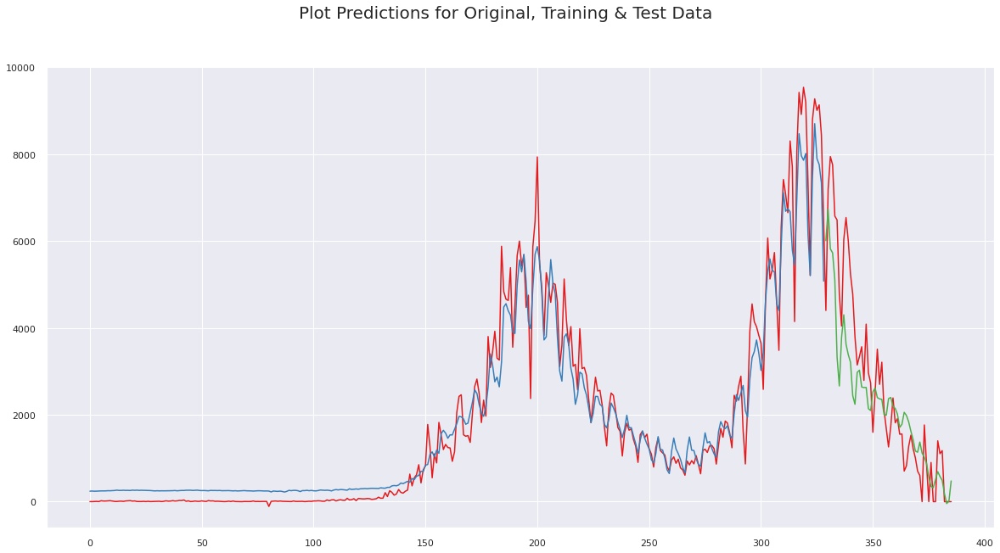

In [64]:
#Plot the predictions

#Total size of plot
total_size = len(predict_on_train) + len(predict_on_test)

#Plot original data
orig_data=cases.new_cases.to_numpy()
orig_data=orig_data.reshape(len(orig_data),1)

#Create a plot for original data
orig_plot = np.empty((total_size,1))
orig_plot[:, :] = np.nan
orig_plot[0:total_size, :] = orig_data[lookback:-2,]

#Create a plot for predictions on training
predict_train_plot = np.empty((total_size,1))
predict_train_plot[:, :] = np.nan
predict_train_plot[0:len(predict_on_train), :] = predict_on_train

#Create a plot for predictions on testing
predict_test_plot = np.empty((total_size,1))
predict_test_plot[:, :] = np.nan
predict_test_plot[len(predict_on_train):total_size, :] = predict_on_test

#Plot the graphs
plt.figure(figsize=(20,10)).suptitle("Plot Predictions for Original, Training & Test Data", fontsize=20)
plt.plot(orig_plot)
plt.plot(predict_train_plot)
plt.plot(predict_test_plot)
plt.show()

Forecasting future Service loads

In [65]:
#Use last part of the training data as the initial lookback
curr_input= test_req_x[-1,:].flatten()

#Predict for the next three months
predict_for = 3 * 30

for i in range(predict_for):
    
    #Take the last lookback no. of samples as X
    this_input=curr_input[-lookback:]
    #Create the input
    this_input=this_input.reshape((1,1,lookback))
    #Predict for the next point
    this_prediction=ts_model.predict(this_input)

    #Add the current prediction to the input
    curr_input = np.append(curr_input,this_prediction.flatten())

#Extract the last predict_for part of curr_input, which contains all the new predictions
predict_on_future=np.reshape(np.array(curr_input[-predict_for:]),(predict_for,1))

# #Inverse to view results
predict_on_future=scaler.inverse_transform(predict_on_future)

print(predict_on_future[:5])

[[476.05103456]
 [856.84602659]
 [586.4665675 ]
 [451.22887604]
 [226.10015571]]


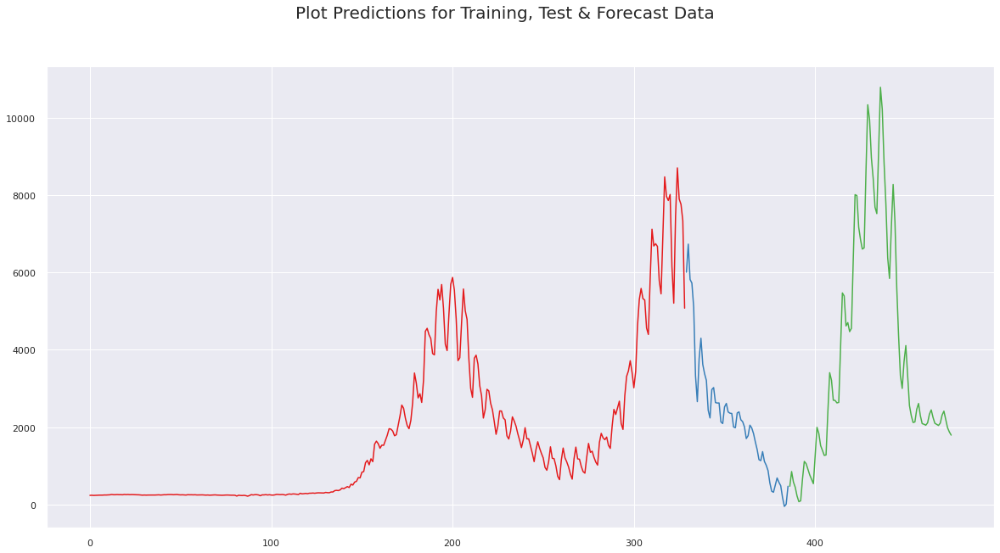

In [66]:
#Plot the training data with the forecast data
total_size = len(predict_on_train) + len(predict_on_test) + len(predict_on_future)

#Setup training chart
predict_train_plot = np.empty((total_size,1))
predict_train_plot[:, :] = np.nan
predict_train_plot[0:len(predict_on_train), :] = predict_on_train

#Setup test chart
predict_test_plot = np.empty((total_size,1))
predict_test_plot[:, :] = np.nan
predict_test_plot[len(predict_on_train):len(predict_on_train)+len(predict_on_test), :] = predict_on_test

#Setup future forecast chart
predict_future_plot = np.empty((total_size,1))
predict_future_plot[:, :] = np.nan
predict_future_plot[len(predict_on_train)+len(predict_on_test):total_size, :] = predict_on_future

plt.figure(figsize=(20,10)).suptitle("Plot Predictions for Training, Test & Forecast Data", fontsize=20)
plt.plot(predict_train_plot)
plt.plot(predict_test_plot)
plt.plot(predict_future_plot)
plt.show()